This notebook is a basic exploration of the dataset and relevant libraries. It can be IGNORED while assessing as the relevant answers to Q2 are in preprocessing.ipynb

In [5]:
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import python_speech_features as psf
from IPython.display import Audio

In [6]:
audio_file = "../data/musan/music/fma/music-fma-0000.wav"

signal, sr = librosa.load(audio_file, sr = 16000)

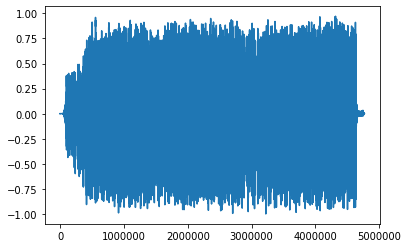

In [7]:
plt.plot(signal)

In [8]:
Audio(signal, rate = sr)

Text(0.5, 1.0, 'Audio above 5 dB')

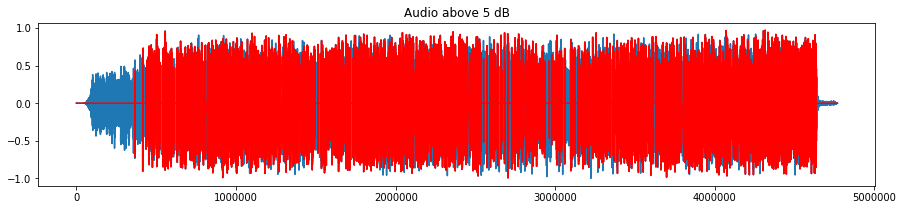

In [9]:
# Threshold level is -5dB

inter_5 = librosa.effects.split(signal, top_db = 5)
above_5 = np.zeros(signal.shape)
for i in inter_5:
    start, end = i
    above_5[start:end] = signal[start:end]
    
#plot them out:
plt.figure(figsize=[15,3]) #figure 1
plt.plot(signal)
plt.plot(above_5,color='red')
plt.title('Audio above 5 dB')

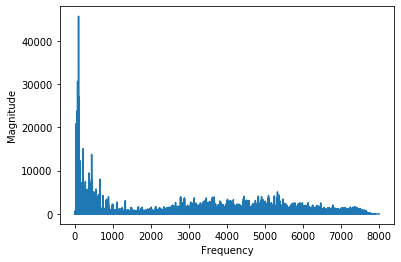

In [10]:
# Plot of the Power Spectrum

fft = np.fft.fft(signal)
magnitude = np.abs(fft)
frequency = np.linspace(0, sr, len(magnitude))

left_freq = frequency[:len(frequency)//2]
left_mag = magnitude[:len(magnitude) //2]

plt.plot(left_freq, left_mag)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()

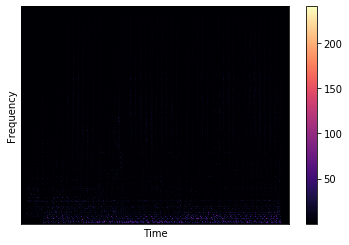

In [11]:
n_fft = 2048
hop_length = 512 # Similar to stride

stft = librosa.core.stft(signal, hop_length = hop_length, n_fft = n_fft)
spectrogram = np.abs(stft)

librosa.display.specshow(spectrogram, sr = sr, hop_length = hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.show()

Spectrogram satisfies the above power spectrum

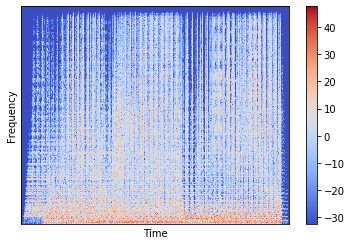

In [12]:
# We will compute a more appropriate spectrogram: the log spectrogram

log_spectrogram = librosa.amplitude_to_db(spectrogram)
librosa.display.specshow(log_spectrogram, sr = sr, hop_length = hop_length)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar()
plt.show()

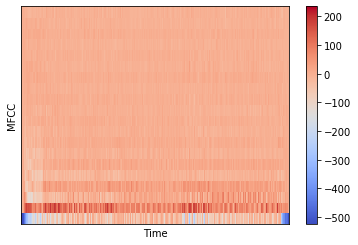

In [13]:
MFCCs = librosa.feature.mfcc(signal, n_fft = n_fft, hop_length = hop_length, n_mfcc = 20)
librosa.display.specshow(MFCCs, sr = sr, hop_length = hop_length)
plt.xlabel("Time")
plt.ylabel("MFCC")
plt.colorbar()
plt.show()

In [14]:
MFCCs.shape

(20, 9312)